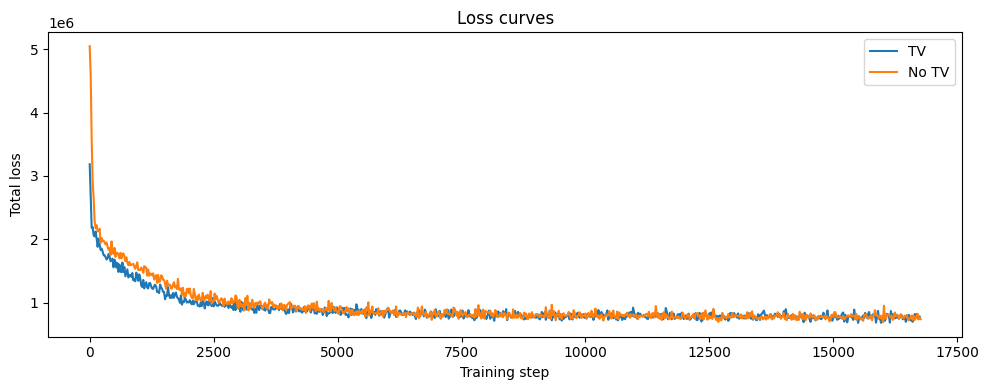

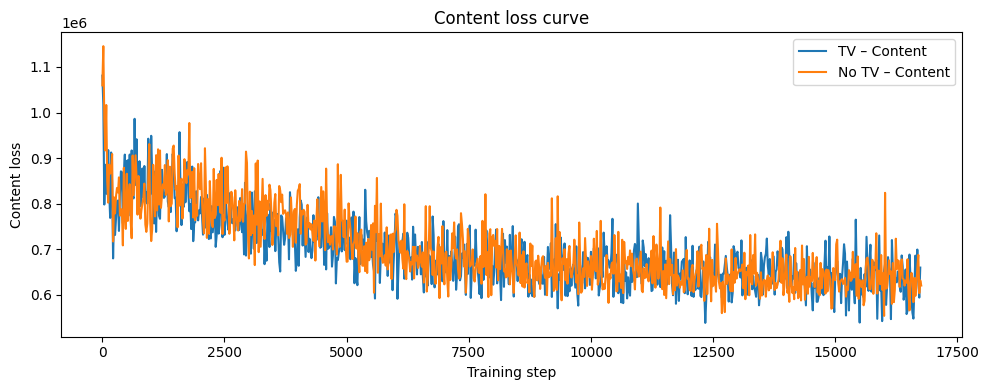

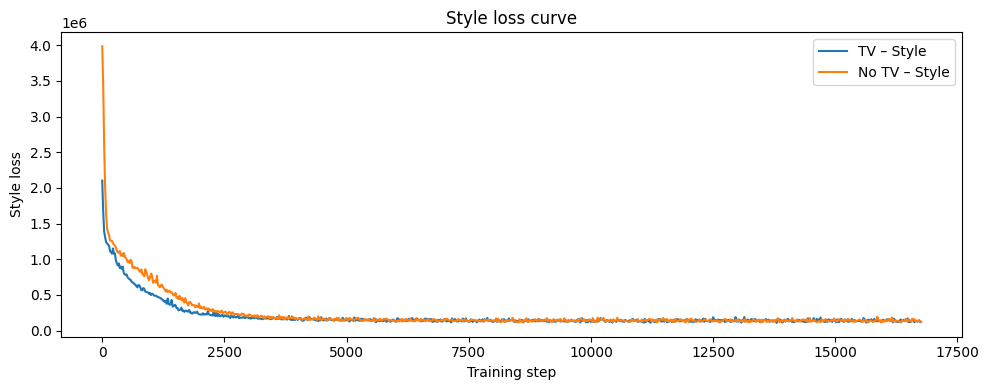

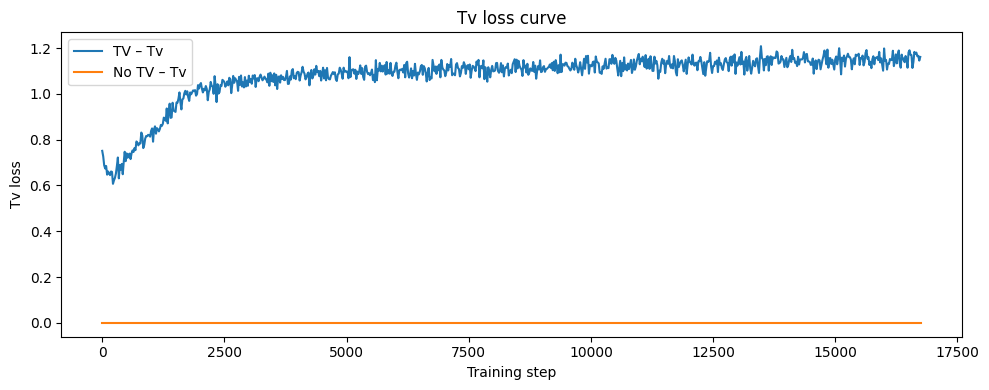

✓ Saved → data/comp3-TVvsNOTV/comps/comparison_grid_40k_no_tv.png


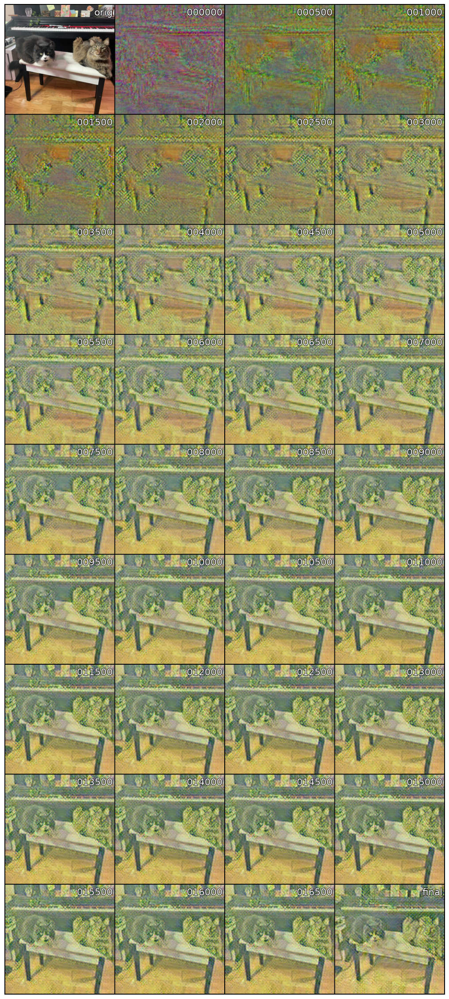

✓ Saved → data/comp3-TVvsNOTV/comps/comparison_grid_40k_tv.png


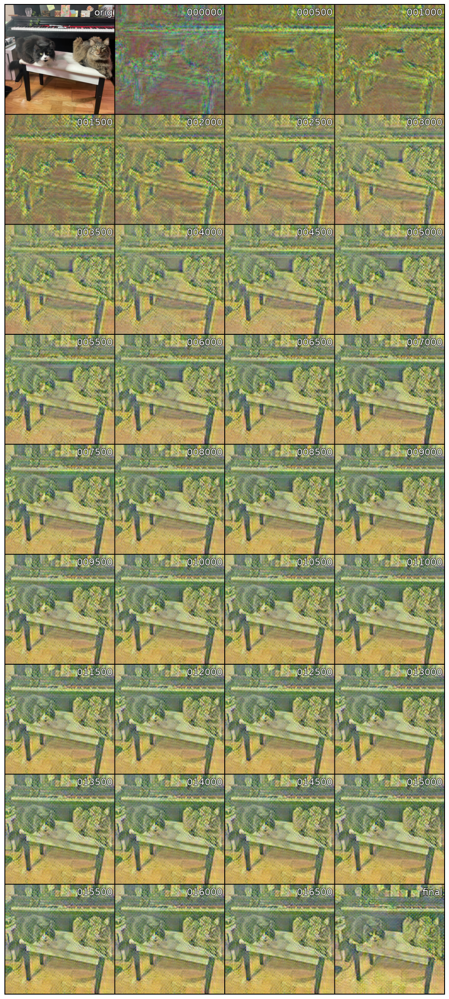

✓ Saved → data/comp3-TVvsNOTV/comps/orig_triplet.png
✓ Saved → data/comp3-TVvsNOTV/comps/tv_triplet.png
✓ Saved → data/comp3-TVvsNOTV/comps/no_tv_triplet.png
✓ Saved → data/comp3-TVvsNOTV/comps/comp_4x4_early.png


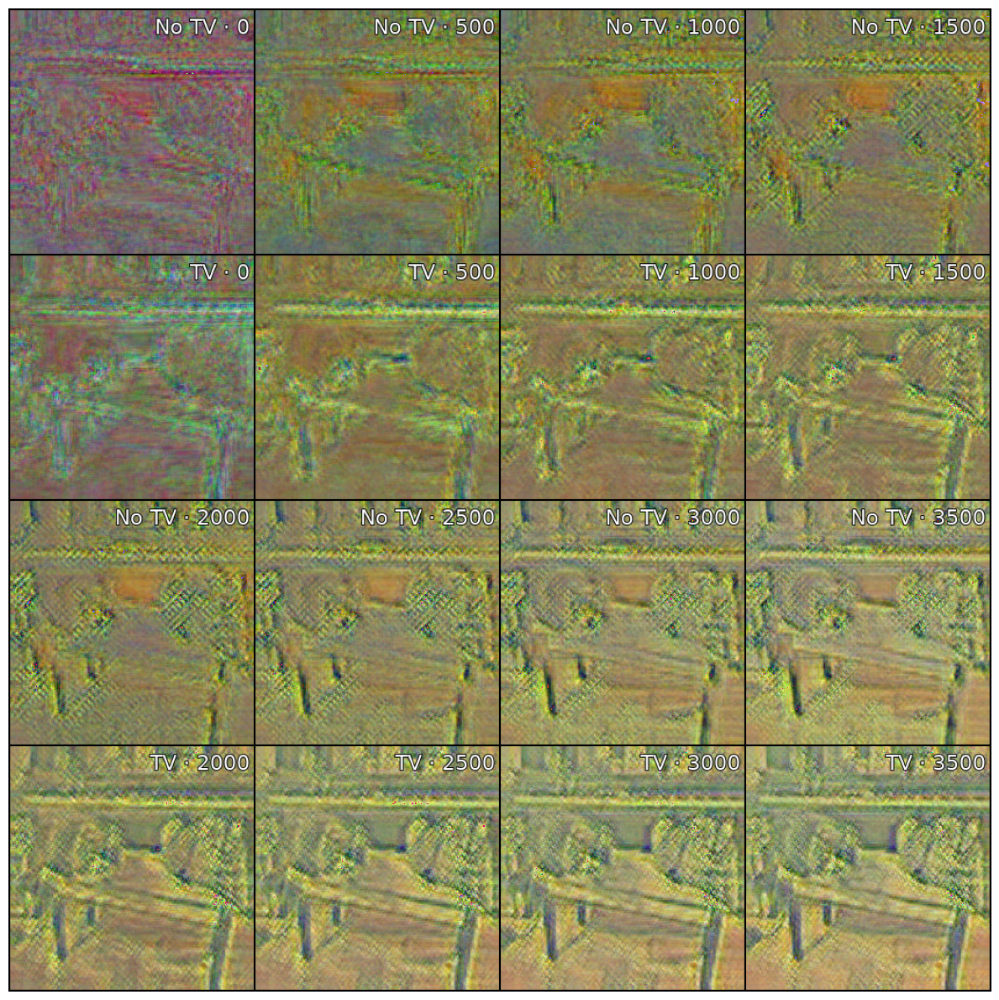

In [199]:
"""style_transfer_analysis.py

A consolidated, self‑contained script for analysing and visualising neural‑style‑transfer
experiments **with** and **without** Total‑Variation (TV) loss.  The workflow covers four
independent tasks:

1. Plot overall loss curves for multiple runs.
2. Plot the individual content / style / TV components.
3. Compare intermediate checkpoints for a *single* content image.
4. Compare final models on *three* randomly‑sampled images.
5. Build a 4×4 grid that juxtaposes early checkpoints from both runs.

Each task can be toggled on/off from the `main()` function at the bottom.
The script keeps exactly the same functionality as the original notebook‑style
code, but is organised into small, reusable helpers and clear section blocks.
"""

from __future__ import annotations

# ───────────────────────────── imports ──────────────────────────────
import os
import glob
import re
import random
from pathlib import Path
from typing import Iterable, List, Tuple

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import matplotlib.font_manager as fm

import torch
from torchvision import utils as vutils
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image, to_tensor

# local project utilities
from utils import denormalize, gram_matrix  # style_transform is defined below
from models import TransformerNet

# ─────────────────────── configuration & constants ─────────────────────────
# Edit these paths to match your folder structure
DATA_DIR          = Path("data")
TRAIN_DIR         = DATA_DIR / "train2014"
CHECKPOINT_DIR_NO_TV = DATA_DIR / "comp3-TVvsNOTV" / "output_40k_5epochs_notv"
CHECKPOINT_DIR_TV    = DATA_DIR / "comp3-TVvsNOTV" / "output_40k_5epochs_tv"
COMPARISON_DIR       = DATA_DIR / "comp3-TVvsNOTV" / "comps"
COMPARISON_DIR.mkdir(parents=True, exist_ok=True)

# model filenames ------------------------------------------------------------
FINAL_WEIGHTS_NO_TV = CHECKPOINT_DIR_NO_TV / "final_paysanne-couchant-1882.pth"
FINAL_WEIGHTS_TV    = CHECKPOINT_DIR_TV    / "final_paysanne-couchant-1882.pth"

# image / device -------------------------------------------------------------
IMAGE_SIZE     = 256
DEVICE         = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")
RNG            = random.Random(42)
FONT_PATH      = fm.findfont("DejaVuSans")
FONT_SIZE      = 22

# ────────────────────────────── helpers ─────────────────────────────────────

def style_transform(size: int = IMAGE_SIZE) -> transforms.Compose:
    """Pre‑processing pipeline that mirrors ImageNet normalisation."""
    return transforms.Compose([
        transforms.Resize((size, size)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
        ),
    ])


def parse_total_loss(log_path: Path, tag: str) -> pd.DataFrame:
    """Extract *total* loss for every 20th iteration from a log‑file."""
    steps, losses = [], []
    step = 0
    with open(log_path) as fh:
        for line in fh:
            match = re.search(r"Tot:([0-9.]+)", line)
            if match:
                steps.append(step)
                losses.append(float(match.group(1)))
                step += 20
    return pd.DataFrame({"step": steps, "loss": losses, "tag": tag})


def parse_component_losses(log_path: Path, tag: str) -> pd.DataFrame:
    """Extract content/style/TV losses (every 20 steps)."""
    records = []
    step = 0
    with open(log_path) as fh:
        for line in fh:
            m = re.search(r"C:([0-9.]+)\s+S:([0-9.]+)\s+TV:([0-9.]+)", line)
            if m:
                records.append({
                    "step": step,
                    "content": float(m.group(1)),
                    "style":   float(m.group(2)),
                    "tv":      float(m.group(3)),
                    "tag":     tag,
                })
                step += 20
    return pd.DataFrame.from_records(records)


def plot_total_losses(runs: dict[str, Path]) -> None:
    plt.figure(figsize=(10, 4))
    df = pd.concat([parse_total_loss(p, t) for t, p in runs.items()], ignore_index=True)
    for tag, grp in sorted(df.groupby("tag"), reverse=True):
        plt.plot(grp["step"], grp["loss"], label=tag)
    plt.xlabel("Training step"); plt.ylabel("Total loss"); plt.title("Loss curves")
    plt.legend(); plt.tight_layout(); plt.show()


def plot_component_losses(runs: dict[str, Path]) -> None:
    df = pd.concat([parse_component_losses(p, t) for t, p in runs.items()], ignore_index=True)
    for component in ("content", "style", "tv"):
        plt.figure(figsize=(10, 4))
        for tag, grp in sorted(df.groupby("tag"), reverse=True):
            plt.plot(grp["step"], grp[component], label=f"{tag} – {component.title()}")
        plt.xlabel("Training step"); plt.ylabel(f"{component.title()} loss")
        plt.title(f"{component.title()} loss curve"); plt.legend(); plt.tight_layout(); plt.show()


def stylise(batch: torch.Tensor, weights_path: Path) -> List[torch.Tensor]:
    """Run a batch through a `TransformerNet` checkpoint and *de‑normalise* the result."""
    net = TransformerNet().to(DEVICE).eval()
    net.load_state_dict(torch.load(weights_path, map_location=DEVICE))
    with torch.no_grad():
        out = net(batch.to(DEVICE)).cpu()
    return [denormalize(img.unsqueeze(0))[0] for img in out]  # list of C×H×W


def annotate(tensor: torch.Tensor, text: str) -> torch.Tensor:
    """Render `text` onto the top‑right corner of an image tensor."""
    pil_img = to_pil_image(tensor)
    draw = ImageDraw.Draw(pil_img)
    font = ImageFont.truetype(FONT_PATH, FONT_SIZE)
    w, h = draw.textbbox((0, 0), text, font=font)[2:]
    draw.text((pil_img.width - w - 4, 4), text,
              font=font, fill=(255, 255, 255), stroke_width=1, stroke_fill=(0, 0, 0))
    return to_tensor(pil_img)


def make_grid(tensors: List[torch.Tensor], nrow: int, save_path: Path | None = None) -> torch.Tensor:
    grid = vutils.make_grid(tensors, nrow=nrow)
    if save_path is not None:
        vutils.save_image(grid, save_path)
        print("✓ Saved →", save_path)
    return grid

# ───────────────────────────── task #3 ─ comparison grid for *one* image ────

def compare_checkpoints_single_image(content_path: Path,
                                     checkpoints: Iterable[Path],
                                     save_path: Path) -> None:
    content_img = Image.open(content_path).convert("RGB")
    content_tensor = style_transform()(content_img).unsqueeze(0)  # 1×C×H×W

    tensors = [denormalize(content_tensor.clone())[0]]  # original
    labels  = ["orig"]

    for ckpt in checkpoints:
        out = stylise(content_tensor.clone(), ckpt)[0]
        tensors.append(out)
        m = re.search(r"ckpt_(\d+)\.pth", ckpt.name)
        labels.append(m.group(1) if m else "final")

    tensors = [annotate(t, lbl) for t, lbl in zip(tensors, labels)]
    grid = make_grid(tensors, nrow=min(len(tensors), 4), save_path=save_path)

    # quick inline preview
    plt.figure(figsize=(grid.shape[2]/80, grid.shape[1]/80))
    plt.imshow(grid.permute(1, 2, 0)); plt.axis("off"); plt.show()

# ─────────────────────────── task #4 ─ triplet comparison ───────────────────

def compare_final_models_on_triplet(save_dir: Path, *, n_images: int = 3) -> None:
    imgs = RNG.sample(list(TRAIN_DIR.glob("*.jpg")), n_images)
    content_batch = torch.stack([style_transform()(Image.open(p).convert("RGB")) for p in imgs])

    originals   = [denormalize(t.unsqueeze(0))[0] for t in content_batch]
    out_tv      = stylise(content_batch.clone(), FINAL_WEIGHTS_TV)
    out_no_tv   = stylise(content_batch.clone(), FINAL_WEIGHTS_NO_TV)

    make_grid(originals,   nrow=3, save_path=save_dir / "orig_triplet.png")
    make_grid(out_tv,      nrow=3, save_path=save_dir / "tv_triplet.png")
    make_grid(out_no_tv,   nrow=3, save_path=save_dir / "no_tv_triplet.png")

# ─────────────────────────── task #5 ─ 4×4 early‑progress grid ──────────────

def progressive_grid(content_img: Path,
                     save_path: Path,
                     iterations: Tuple[int, ...] = (0, 500, 1000, 1500, 2000, 2500, 3000, 3500),
                     *,
                     size: int = IMAGE_SIZE) -> None:
    content_pil = Image.open(content_img).convert("RGB")
    content_tensor = style_transform(size)(content_pil).unsqueeze(0)

    def ckpt_path(run_dir: Path, it: int) -> Path:
        name = "ckpt_000000.pth" if it == 0 else f"ckpt_{it:06d}.pth"
        return run_dir / name

    tensors, labels = [], []
    # row‑major order: No‑TV, TV (early) → No‑TV, TV (later)
    for run_dir, tag in ((CHECKPOINT_DIR_NO_TV, "No TV"), (CHECKPOINT_DIR_TV, "TV")):
        for it in iterations[:4]:
            tensors.append(stylise(content_tensor, ckpt_path(run_dir, it))[0])
            labels.append(f"{tag} · {it}")
    for run_dir, tag in ((CHECKPOINT_DIR_NO_TV, "No TV"), (CHECKPOINT_DIR_TV, "TV")):
        for it in iterations[4:]:
            tensors.append(stylise(content_tensor, ckpt_path(run_dir, it))[0])
            labels.append(f"{tag} · {it}")

    tensors = [annotate(t, lbl) for t, lbl in zip(tensors, labels)]
    grid = make_grid(tensors, nrow=4, save_path=save_path)

    plt.figure(figsize=(12, 12)); plt.imshow(grid.permute(1, 2, 0)); plt.axis("off")
    plt.tight_layout(); plt.show()

# ──────────────────────────────── main ──────────────────────────────────────

def main():
    # 1️⃣ Loss curves ---------------------------------------------------------
    runs = {
        "No TV": CHECKPOINT_DIR_NO_TV / "loss_log.txt",
        "TV":    CHECKPOINT_DIR_TV    / "loss_log.txt",
    }
    plot_total_losses(runs)
    plot_component_losses(runs)

    # 2️⃣ Single‑image checkpoint comparison ---------------------------------
    ckpts_no_tv = sorted(CHECKPOINT_DIR_NO_TV.glob("ckpt_*.pth"),
                   key=lambda p: int(re.search(r"ckpt_(\d+)\.pth", p.name)[1]))
    ckpts_no_tv.append(CHECKPOINT_DIR_NO_TV / "final_paysanne-couchant-1882.pth")
    
    ckpts_tv = sorted(CHECKPOINT_DIR_TV.glob("ckpt_*.pth"),
                   key=lambda p: int(re.search(r"ckpt_(\d+)\.pth", p.name)[1]))
    ckpts_tv.append(CHECKPOINT_DIR_TV / "final_paysanne-couchant-1882.pth")
    
    compare_checkpoints_single_image(
        content_path=DATA_DIR / "train2014_1" / "IMG_7008.jpg",
        checkpoints=ckpts_no_tv,
        save_path=COMPARISON_DIR / "comparison_grid_40k_no_tv.png",
    )
    
    compare_checkpoints_single_image(
        content_path=DATA_DIR / "train2014_1" / "IMG_7008.jpg",
        checkpoints=ckpts_tv,
        save_path=COMPARISON_DIR / "comparison_grid_40k_tv.png",
    )

    # 3️⃣ Triplet comparison of final models ---------------------------------
    compare_final_models_on_triplet(COMPARISON_DIR)

    # 4️⃣ Early‑progress 4×4 grid -------------------------------------------
    progressive_grid(
        content_img=DATA_DIR / "train2014_1" / "IMG_7008.jpg",
        save_path=DATA_DIR / "comp3-TVvsNOTV/comps" / "comp_4x4_early.png",
    )


if __name__ == "__main__":
    main()
